# Importing useful libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import matplotlib.pyplot as plt
import matplotlib.image as img
from PIL import Image
import numpy as np
import random
import cv2
import os

Mounted at /content/drive


# Setting up folder paths

In [2]:
data_path = '/content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas/'

png_images_path = f'{data_path}/imgs/'

# Loading PNG images



In [8]:
png_images_files = os.listdir(png_images_path)

images_metadatas = []
images_arrays = []

for file in png_images_files:
    if file.endswith('.jpg'):
        full_path = os.path.join(png_images_path, file)
        image = cv2.imread(full_path, cv2.IMREAD_COLOR)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if image_rgb is not None:
            image_metadata = {
                "metadata": {"file_name": file}
            }
            images_metadatas.append(image_metadata)
            images_arrays.append(image_rgb)
            print(f"Image at {full_path} loaded successfully.")
        else:
            print(f"Image at {full_path} could not be loaded.")

Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/emotions-3490223_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/gem-3190526_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/ai-generated-8529788_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/dog-1772759_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/snail-8577681_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/toadstool-8296596_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/dog-8269584_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/m10/sem2/ponderadas//imgs/woman-8552807_1280.jpg loaded successfully.
Image at /content/drive/MyDrive/Colab Notebooks/

# Resizing all images to the same scale

In [9]:
def resize_images(images_arrays, width, height):
    """
    Resizes a list of image arrays to the specified dimensions.

    Parameters:
        images_arrays (list of numpy.ndarray): List of image arrays to be resized.
        width (int): Desired width for the resized images.
        height (int): Desired height for the resized images.

    Returns:
        list of numpy.ndarray: List of resized image arrays.
    """
    resized_images = [cv2.resize(image, (width, height), interpolation=cv2.INTER_LINEAR) for image in images_arrays]
    return resized_images

In [13]:
images_arrays_resized = resize_images(images_arrays, 853, 1280)

# Defining function to visualize images and their shapes

In [14]:
def plot_images(images_arrays, images_metadatas=None, num_columns=5, figsize=(15, 3)):
    """
    Plots images with their metadata as titles in a grid layout.

    Parameters:
        images_arrays (list): List of image arrays.
        images_metadatas (list, optional): List of dictionaries containing image metadata. Defaults to None.
        num_columns (int, optional): Number of columns in the grid layout. Defaults to 5.
        figsize (tuple, optional): Figure size. Defaults to (15, 3).
    """
    num_images = len(images_arrays)
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(figsize[0], figsize[1] * num_rows))
    fig.tight_layout(pad=3.0)

    axes = axes.ravel()

    for idx in range(num_images):
        ax = axes[idx]
        ax.imshow(images_arrays[idx])
        if images_metadatas is not None and 'file_name' in images_metadatas[idx]['metadata']:
            ax.set_title(f"{images_metadatas[idx]['metadata']['file_name']}\nShape {images_arrays[idx].shape}", fontsize=10)
        else:
            ax.set_title(f"Image {idx}\nShape {images_arrays[idx].shape}", fontsize=10)
        ax.grid(False)
        ax.axis('on')

    for ax in axes[num_images:]:
        ax.axis('off')

    plt.show()

### Visualizing images in their original sizes

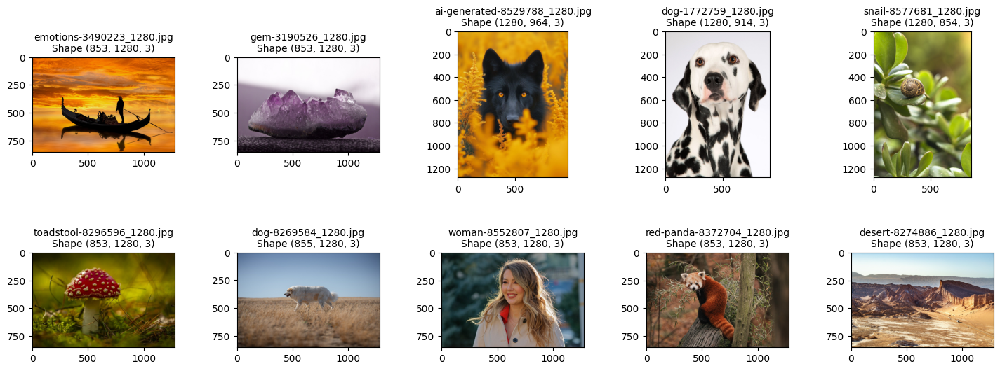

In [15]:
plot_images(images_arrays, images_metadatas=images_metadatas)

### Visualizing images in their new sizes

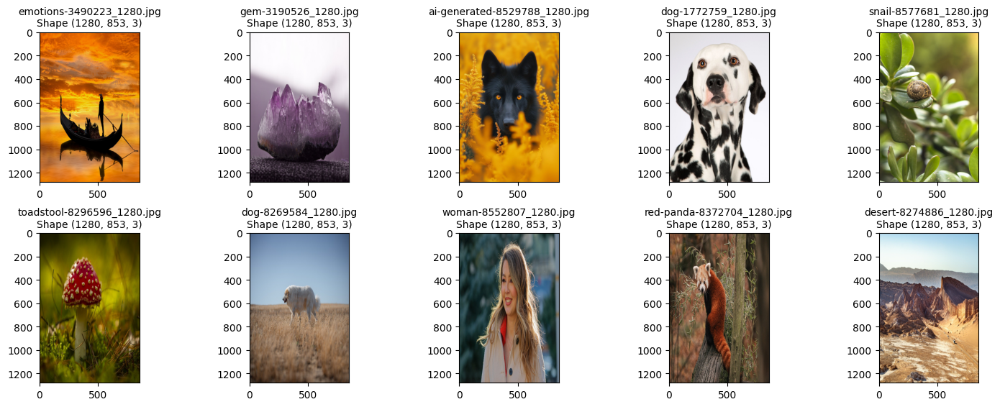

In [17]:
plot_images(images_arrays_resized, images_metadatas=images_metadatas)

# Defining Data Augmentation

In [21]:
def data_augmentation(image, num_augmentations=3):
    """
    Applies data augmentation to a single image.

    Parameters:
        image (numpy.ndarray): The numpy array representing the original image.
        num_augmentations (int, optional): Number of augmentations to apply to the image. Defaults to 3.

    Returns:
        list: List of numpy.ndarray representing the augmented images.
    """
    augmented_images = []
    previous_transformations = set()

    while len(augmented_images) < num_augmentations:
        # Randomly choose augmentation type
        augmentation_type = random.choice(['rotate', 'translate', 'flip', 'brightness_contrast'])

        # Generate random transformation parameters
        if augmentation_type == 'rotate':
            angle = random.choice([-15, -10, -5, 5, 10, 15])  # Rotation angles in degrees
            transformation_key = ('rotate', angle)
        elif augmentation_type == 'translate':
            translation = random.choice([(15, 15), (-15, -15), (15, -15), (-15, 15), (10, 10), (-10, -10), (10, -10), (-10, 10)])  # Translations in (dx, dy) format
            transformation_key = ('translate', translation)
        elif augmentation_type == 'flip':
            flip_type = random.choice([-1, 0, 1])  # Flip horizontally, vertically, or both
            transformation_key = ('flip', flip_type)
        elif augmentation_type == 'brightness_contrast':
            alpha = random.uniform(0.3, 3.0)  # Randomly choose alpha (contrast)
            beta = random.randint(-100, 100)  # Randomly choose beta (brightness)
            transformation_key = ('brightness_contrast', alpha, beta)

        # Check if the generated transformation has already been applied
        if transformation_key in previous_transformations:
            continue  # Skip if transformation already applied

        # Apply the transformation and store the image
        if augmentation_type == 'rotate':
            augmented_image = rotate_image(image, angle)
        elif augmentation_type == 'translate':
            augmented_image = translate_image(image, translation)
        elif augmentation_type == 'flip':
            augmented_image = flip_image(image, flip_type)
        elif augmentation_type == 'brightness_contrast':
            augmented_image = adjust_brightness_contrast(image, alpha, beta)

        augmented_images.append(augmented_image)
        previous_transformations.add(transformation_key)

    return augmented_images

def rotate_image(image, angle):
    """
    Rotates the given image by the specified angle.

    Parameters:
        image (numpy.ndarray): The numpy array representing the image.
        angle (int): The rotation angle in degrees.

    Returns:
        numpy.ndarray: The rotated image.
    """
    height, width = image.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

def translate_image(image, translation):
    """
    Translates the given image by the specified translation (dx, dy).

    Parameters:
        image (numpy.ndarray): The numpy array representing the image.
        translation (tuple): The translation in (dx, dy) format.

    Returns:
        numpy.ndarray: The translated image.
    """
    height, width = image.shape[:2]
    translation_matrix = np.float32([[1, 0, translation[0]], [0, 1, translation[1]]])
    translated_image = cv2.warpAffine(image, translation_matrix, (width, height))
    return translated_image

def apply_random_filter(image):
    """
    Applies a random filter to the given image.

    Parameters:
        image (numpy.ndarray): The numpy array representing the image.

    Returns:
        numpy.ndarray: The image with the applied filter.
    """
    filters = [cv2.GaussianBlur, cv2.medianBlur, cv2.bilateralFilter]
    selected_filter = random.choice(filters)
    if selected_filter == cv2.GaussianBlur or selected_filter == cv2.medianBlur:
        filtered_image = selected_filter(image, (5, 5))  # Kernel size: 5x5
    else:  # selected_filter == cv2.bilateralFilter
        filtered_image = selected_filter(image, 9, 75, 75)  # d: Diameter of pixel neighborhood, sigmaColor: Filter sigma in the color space, sigmaSpace: Filter sigma in the coordinate space
    return filtered_image

def apply_random_blur(image):
    """
    Applies random blur to the given image.

    Parameters:
        image (numpy.ndarray): The numpy array representing the image.

    Returns:
        numpy.ndarray: The image with the applied blur.
    """
    blur_types = ['gaussian', 'median', 'bilateral']
    selected_blur_type = random.choice(blur_types)
    if selected_blur_type == 'gaussian':
        blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
    elif selected_blur_type == 'median':
        blurred_image = cv2.medianBlur(image, 5)
    elif selected_blur_type == 'bilateral':
        blurred_image = cv2.bilateralFilter(image, 9, 75, 75)
    return blurred_image

def flip_image(image, flip_type):
  """
  Applies flip transformation to the given image.

  Parameters:
      image (numpy.ndarray): The numpy array representing the image.
      flip_type (int): Type of flip transformation.
                        0: Flip vertically
                        1: Flip horizontally
                        -1: Flip both vertically and horizontally

  Returns:
      numpy.ndarray: The image with the applied flip transformation.
  """
  return cv2.flip(image, flip_type)

def adjust_brightness_contrast(image, alpha, beta):
    """
    Applies brightness and contrast adjustment to the given image.

    Parameters:
        image (numpy.ndarray): The numpy array representing the image.
        alpha (float): Alpha value for contrast adjustment.
        beta (int): Beta value for brightness adjustment.

    Returns:
        numpy.ndarray: The image with the applied brightness and contrast adjustment.
    """
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

# Applying Data Augmentation and visualizing results

In [31]:
all_augmented_imgs = []

for image_array in images_arrays_resized:
  augmented_imgs = data_augmentation(image=image_array, num_augmentations=5)
  all_augmented_imgs.append(augmented_imgs)

augmented_imgs_one_array = [image for array in all_augmented_imgs for image in array]

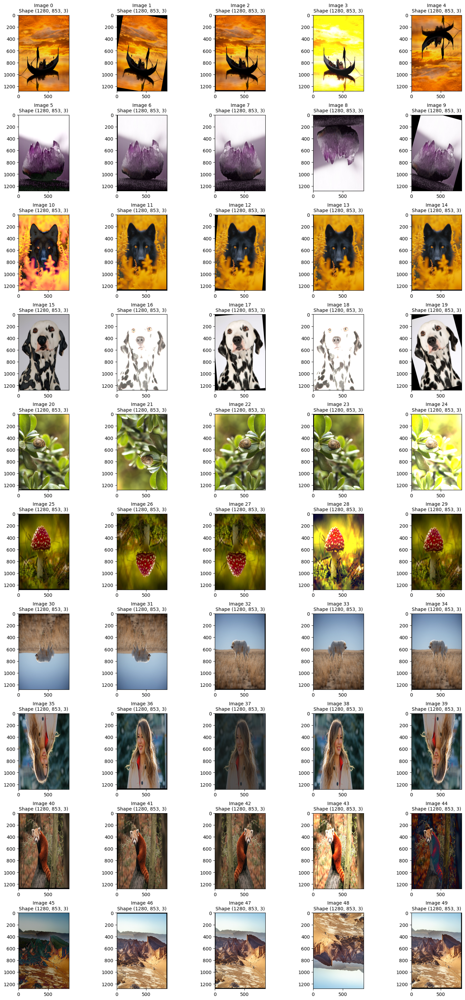

In [32]:
plot_images(augmented_imgs_one_array)

# Applying Canny Edge Detection Algorithm

In [33]:
def detect_edges(images, low_threshold=50, high_threshold=150):
    """
    Applies the Canny edge detection algorithm to a list of images.

    Parameters:
        images (list of numpy.ndarray): List of image arrays in RGB format.
        low_threshold (int, optional): Lower bound for the hysteresis thresholding. Defaults to 50.
        high_threshold (int, optional): Upper bound for the hysteresis thresholding. Defaults to 150.

    Returns:
        list of numpy.ndarray: List of edge-detected images.
    """
    edge_images = []
    for image in images:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(gray_image, low_threshold, high_threshold)
        edge_images.append(edges)
    return edge_images

In [34]:
edges_images = detect_edges(augmented_imgs_one_array)

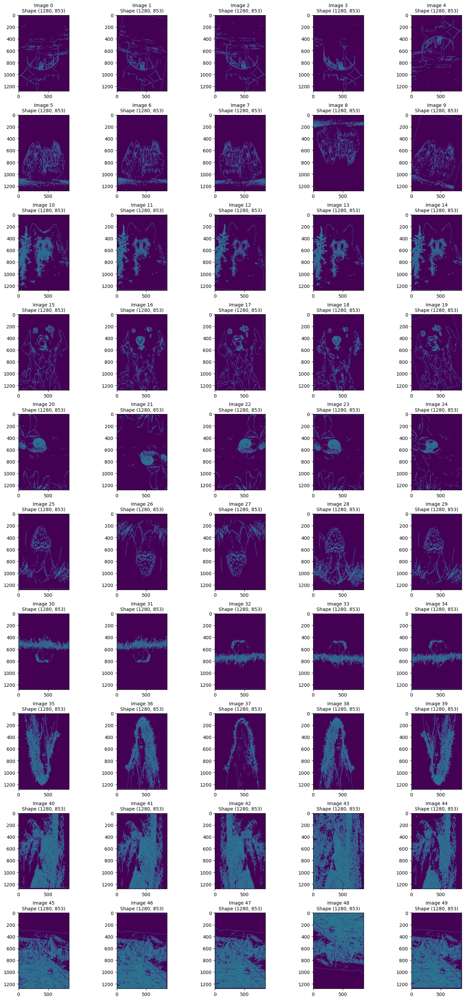

In [35]:
plot_images(edges_images)

# Normalizing images

In [36]:
def normalize_images(images):
    """
    Normalizes the pixel values in the images to the range [0, 1].

    Parameters:
        images (list of numpy.ndarray): List of image arrays.

    Returns:
        list of numpy.ndarray: List of normalized images.
    """
    normalized_images = []
    for image in images:
        normalized_image = image.astype(np.float32) / 255.0
        normalized_images.append(normalized_image)
    return normalized_images

In [37]:
normalized_images = normalize_images(augmented_imgs_one_array)

### Comparing pixels of original image and normalized image

In [38]:
augmented_imgs_one_array[0]

array([[[195,  83,   7],
        [192,  80,   4],
        [188,  76,   0],
        ...,
        [224,  99,   7],
        [230, 106,   9],
        [235, 109,   9]],

       [[195,  83,   7],
        [190,  78,   2],
        [186,  74,   0],
        ...,
        [219,  95,   4],
        [225, 102,   6],
        [230, 105,   7]],

       [[194,  82,   6],
        [189,  76,   1],
        [185,  72,   0],
        ...,
        [213,  90,   1],
        [219,  96,   3],
        [222,  99,   4]],

       ...,

       [[205,  98,   0],
        [205,  98,   0],
        [204,  97,   0],
        ...,
        [224, 109,   0],
        [224, 109,   0],
        [223, 108,   0]],

       [[203,  96,   0],
        [203,  96,   0],
        [204,  97,   0],
        ...,
        [224, 109,   0],
        [224, 109,   0],
        [223, 108,   0]],

       [[203,  96,   0],
        [203,  96,   0],
        [204,  97,   0],
        ...,
        [224, 109,   0],
        [224, 109,   0],
        [223, 108,   0]]

In [39]:
normalized_images[0]

array([[[0.7647059 , 0.3254902 , 0.02745098],
        [0.7529412 , 0.3137255 , 0.01568628],
        [0.7372549 , 0.29803923, 0.        ],
        ...,
        [0.8784314 , 0.3882353 , 0.02745098],
        [0.9019608 , 0.41568628, 0.03529412],
        [0.92156863, 0.42745098, 0.03529412]],

       [[0.7647059 , 0.3254902 , 0.02745098],
        [0.74509805, 0.30588236, 0.00784314],
        [0.7294118 , 0.2901961 , 0.        ],
        ...,
        [0.85882354, 0.37254903, 0.01568628],
        [0.88235295, 0.4       , 0.02352941],
        [0.9019608 , 0.4117647 , 0.02745098]],

       [[0.7607843 , 0.32156864, 0.02352941],
        [0.7411765 , 0.29803923, 0.00392157],
        [0.7254902 , 0.28235295, 0.        ],
        ...,
        [0.8352941 , 0.3529412 , 0.00392157],
        [0.85882354, 0.3764706 , 0.01176471],
        [0.87058824, 0.3882353 , 0.01568628]],

       ...,

       [[0.8039216 , 0.38431373, 0.        ],
        [0.8039216 , 0.38431373, 0.        ],
        [0.8       , 0

Pixels values ranging from 0 to 1.

# Texture enhancment

In [42]:
def enhance_texture(images, kernel_size=3):
    """
    Enhances the texture of images using a Laplacian filter.

    Parameters:
        images (list of numpy.ndarray): List of image arrays.
        kernel_size (int, optional): The size of the Laplacian kernel. Defaults to 3.

    Returns:
        list of numpy.ndarray: List of texture-enhanced images.
    """
    texture_enhanced_images = []
    for image in images:
        laplacian = cv2.Laplacian(image, cv2.CV_64F, ksize=kernel_size)
        texture_enhanced_image = cv2.convertScaleAbs(laplacian)
        texture_enhanced_images.append(texture_enhanced_image)
    return texture_enhanced_images

In [43]:
texture_enhanced_images = enhance_texture(augmented_imgs_one_array)

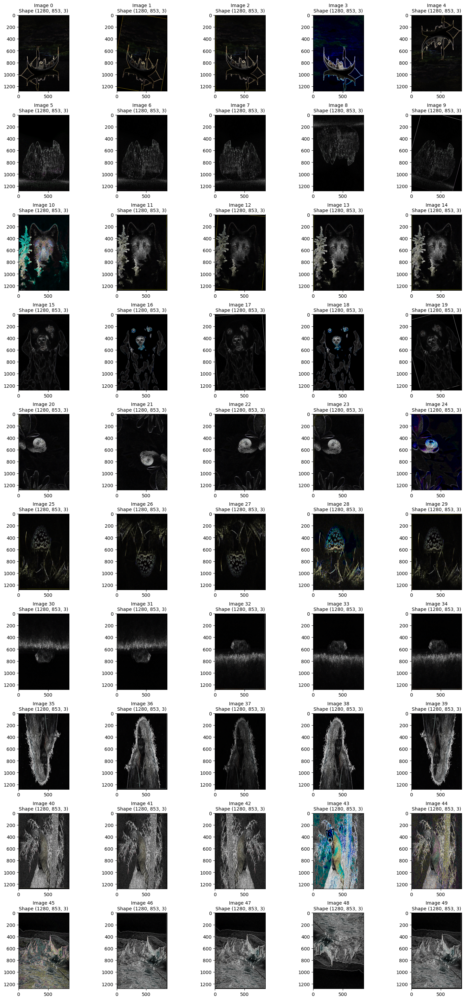

In [44]:
plot_images(texture_enhanced_images)

# Blurring

In [45]:
def apply_blur_filter(images, kernel_size=(5, 5)):
    """
    Applies a blurring filter to each image to reduce noise.

    Parameters:
        images (list of numpy.ndarray): List of image arrays.
        kernel_size (tuple, optional): The size of the kernel used for the blur. Defaults to (5, 5).

    Returns:
        list of numpy.ndarray: List of blurred images.
    """
    blurred_images = []
    for image in images:
        blurred_image = cv2.blur(image, kernel_size)
        blurred_images.append(blurred_image)
    return blurred_images

In [46]:
blurring_images = apply_blur_filter(augmented_imgs_one_array)

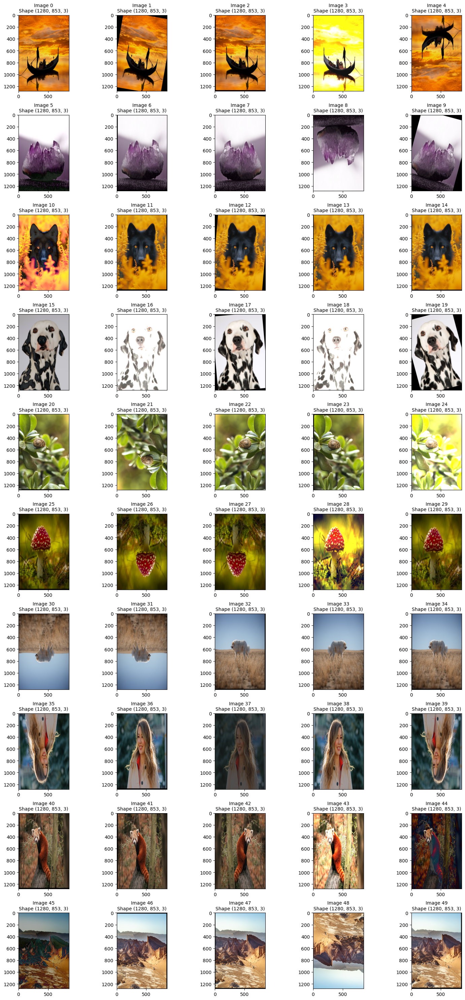

In [47]:
plot_images(blurring_images)